In [3]:
from pathlib import Path
import pandas as pd
import plotly.express as px
from wordcloud import WordCloud

# Procedure

1. Load the text data 
2. Describe the data
   1. Check for missing values
   2. Check for duplicate values
   3. Check for the distribution of the target variable
   4. Check for the distribution of the text data


In [5]:
work_dir = Path().absolute().parent
data_dir = work_dir / "data" / "raw"

In [3]:
# load the data 
column_names = ["id", "product", "sentiment", "text"]
train = pd.read_csv(data_dir / "training.csv", header=None, names=column_names)
test = pd.read_csv(data_dir / "validation.csv", header=None, names=column_names)

In [4]:
# print training data information 
train.info()

# print the first 5 rows of the training data
train.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74682 entries, 0 to 74681
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id         74682 non-null  int64 
 1   product    74682 non-null  object
 2   sentiment  74682 non-null  object
 3   text       73996 non-null  object
dtypes: int64(1), object(3)
memory usage: 2.3+ MB


,id,product,sentiment,text
0,2401,Borderlands,Positive,im getting on borderlands and i will murder yo...
1,2401,Borderlands,Positive,I am coming to the borders and I will kill you...
2,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...
3,2401,Borderlands,Positive,im coming on borderlands and i will murder you...
4,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...


- the id column has duplicated values (probably since this is a synthetic dataset)
- There are **no missing values** in any of the `[id, product, sentiment]` columns.
- There are **686 missing values** in the `text` column. 
- the rows with missing `text` will be **removed**, since we cannot train a classifier on examples with no text.
- also any **duplicate** rows will be **removed**.

In [12]:
# get duplicated rows 
duplicated_rows = train[train.duplicated()]
print(f"duplicated rows:")
duplicated_rows

duplicated rows:


,id,product,sentiment,text
20,2404,Borderlands,Positive,that was the first borderlands session in a lo...
26,2405,Borderlands,Negative,The biggest disappointment of my life came a y...
51,2409,Borderlands,Neutral,Blaming Sight for Tardiness! A little bit of b...
64,2411,Borderlands,Neutral,.. [
146,2425,Borderlands,Negative,"""What a bitch!"""
...,...,...,...,...
74505,9171,Nvidia,Neutral,This benchmarking comparison between Oculus Qu...
74510,9172,Nvidia,Positive,@ NVIDIAGeForce @ nvidia
74589,9185,Nvidia,Neutral,Heard people are having issues with ordering t...
74619,9190,Nvidia,Positive,This news about the Nvidia 3000 series is ligi...


In [17]:
# include sentiment column just in case for the future
# here it has no effect, since there are no missing values in the sentiment column
train = train.dropna(subset=["text", "sentiment"]) 
train = train.drop_duplicates()
train.info() # sanity check

<class 'pandas.core.frame.DataFrame'>
Index: 71656 entries, 0 to 74681
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id         71656 non-null  int64 
 1   product    71656 non-null  object
 2   sentiment  71656 non-null  object
 3   text       71656 non-null  object
dtypes: int64(1), object(3)
memory usage: 2.7+ MB


In [19]:
# plot the distribution of the product column
px.bar(train.value_counts("product"), title="Value Counts in the `product` Column in the Training Data")

In [23]:
# plot the distribution of the sentiment column 
px.bar(train.value_counts("sentiment"), title="Value Counts in the `sentiment` Column in the Training Data")

In [64]:
# text length distribution
text_length = train.text.str.len().rename("text_length")
text_length_stat = text_length.describe()
print(text_length_stat)

px.histogram(train.text.str.len(), title="Text Length Distribution in the Training Data")

count    71656.000000
mean       110.538127
std         79.409848
min          1.000000
25%         49.000000
50%         93.000000
75%        155.000000
max        957.000000
Name: text_length, dtype: float64
lower bound: -110.0, upper bound: 314.0


In [25]:
px.box(train.text.str.len(), title="Text Length Distribution in the Training Data")

In [26]:
# token count distribution
px.histogram(train.text.str.split().map(len), title="Token Count Distribution in the Training Data")

In [27]:
# token count distribution box plot
px.box(train.text.str.split().map(len), title="Token Count Distribution in the Training Data")

In [28]:
# text length grouped by sentiment
px.box(train, x="sentiment", y=train.text.str.len(), title="Text Length Grouped by Sentiment")

In [29]:
# token count grouped by sentiment
px.box(train, x="sentiment", y=train.text.str.split().map(len), title="Token Count Grouped by Sentiment")

In [30]:
# text length grouped by product
px.box(train, x="product", y=train.text.str.len(), title="Text Length Grouped by Product")

In [31]:
# token count grouped by product
px.box(train, x="product", y=train.text.str.split().map(len), title="Token Count Grouped by Product")

In [38]:
px.bar(train.groupby("product").value_counts(["sentiment"]).reset_index(), x="product", y="count", color="sentiment", title="Sentiment Distribution Grouped by Product")

In [52]:
word_cloud = WordCloud(width=800, height=400, max_words=200, background_color="white")

Positive Word Cloud:


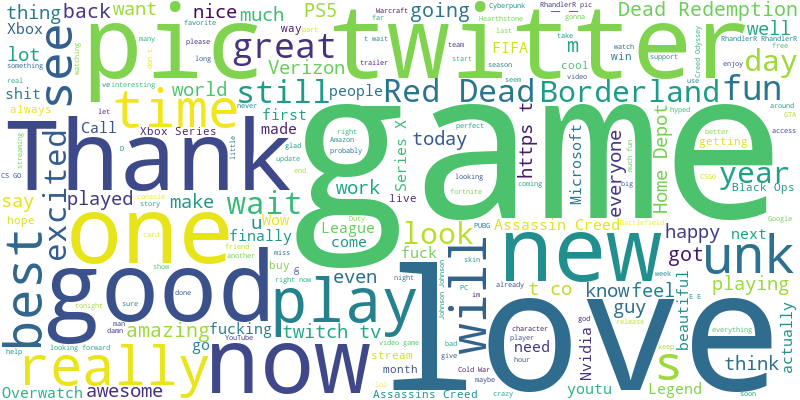

In [53]:
positive_cloud = word_cloud.generate(" ".join(train.query("sentiment == 'Positive'").text), )
print("Positive Word Cloud:")
positive_cloud.to_image()

Negative Word Cloud:


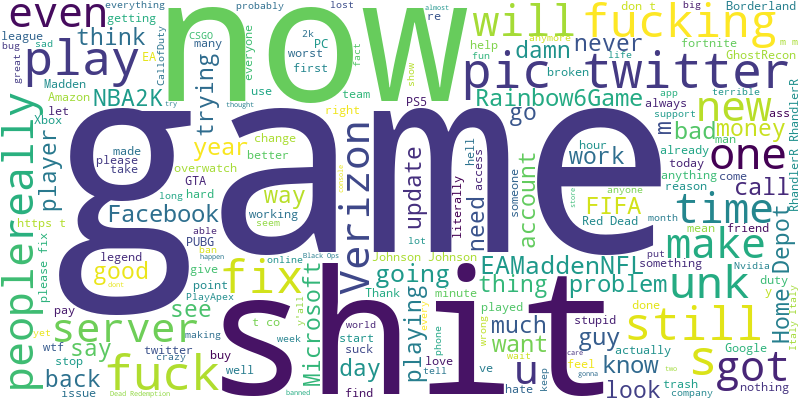

In [54]:
negative_cloud = word_cloud.generate(" ".join(train.query("sentiment == 'Negative'").text))
print("Negative Word Cloud:")
negative_cloud.to_image()

Neutral Word Cloud:


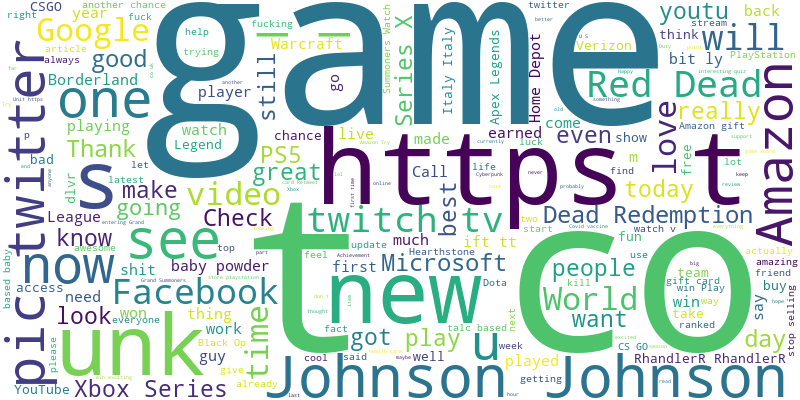

In [55]:
neutral_cloud = word_cloud.generate(" ".join(train.query("sentiment == 'Neutral'").text))
print("Neutral Word Cloud:")
neutral_cloud.to_image()

Irrelevant Word Cloud:


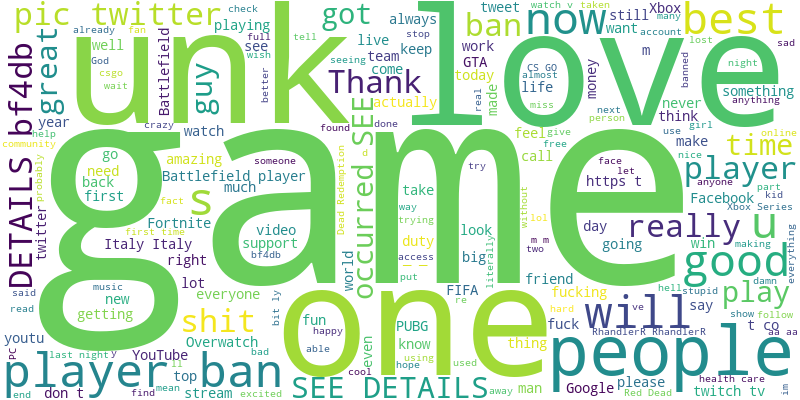

In [56]:
# word cloud for irrelevant sentiment
irrelevant_cloud = word_cloud.generate(" ".join(train.query("sentiment == 'Irrelevant'").text))
print("Irrelevant Word Cloud:")
irrelevant_cloud.to_image()

In [57]:
# query very short texts 
train.query("text.str.len() < 10")

,id,product,sentiment,text
11,2402,Borderlands,Positive,was
53,2409,Borderlands,Neutral,all
60,2411,Borderlands,Neutral,. . [
62,2411,Borderlands,Neutral,.. [
63,2411,Borderlands,Neutral,.. 45
...,...,...,...,...
74477,9166,Nvidia,Positive,<unk> The
74507,9171,Nvidia,Neutral,You
74591,9185,Nvidia,Neutral,you
74597,9186,Nvidia,Positive,from


In [58]:
# query very long texts
very_long_texts = train.query("text.str.len() > 500")

,id,product,sentiment,text
3098,1737,CallOfDutyBlackopsColdWar,Negative,"Italy, Italy, Italy, Italy, Italy, Italy, Ital..."
3968,1885,CallOfDutyBlackopsColdWar,Irrelevant,"Italy, Italy, Italy, Italy, Italy, Italy, Ital..."
10256,12966,Xbox(Xseries),Neutral,"Italy, Italy, Italy, Italy, Italy, Italy, Ital..."
18128,9907,PlayStation5(PS5),Positive,"Italy, Italy, Italy, Italy, Italy, Italy, Ital..."
27410,1120,AssassinsCreed,Negative,"Finally, Kingdom Come:. Deliverance... The per..."
28994,588,ApexLegends,Negative,"At the same time, there are many low-income co..."
32594,7591,LeagueOfLegends,Positive,playing in 0.3% league tile Clothing is SO enj...
36308,8231,Microsoft,Irrelevant,"Italy, Italy, Italy, Italy, Italy, Italy, Ital..."
52136,10556,RedDeadRedemption(RDR),Neutral,There was a meeting with the interns on their ...
59126,3335,Facebook,Irrelevant,"Italy, Italy, Italy, Italy, Italy, Italy, Ital..."


In [28]:
test.info()
test.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id         1000 non-null   int64 
 1   product    1000 non-null   object
 2   sentiment  1000 non-null   object
 3   text       1000 non-null   object
dtypes: int64(1), object(3)
memory usage: 31.4+ KB


,id,product,sentiment,text
0,3364,Facebook,Irrelevant,I mentioned on Facebook that I was struggling ...
1,352,Amazon,Neutral,BBC News - Amazon boss Jeff Bezos rejects clai...
2,8312,Microsoft,Negative,@Microsoft Why do I pay for WORD when it funct...
3,4371,CS-GO,Negative,"CSGO matchmaking is so full of closet hacking,..."
4,4433,Google,Neutral,Now the President is slapping Americans in the...
